# **<span style="color: #87CEEB;"> CS437/CS5317/EE414/EE513 Deep Learning Programming Assignment 2</span>**

# <span style="color: #9370DB;">**Submission Guidelines**</span>

- <span style="color: #9370DB;">Please rename the file to `<RollNumber>_PA1_1`.</span>
- <span style="color: #9370DB;">Please also submit a **.py** file of every Notebook. You can do this by exporting your **ipynb** to a Python script.</span>
- <span style="color: #9370DB;">Please submit a zipped folder of both your Jupyter Notebooks and Python script files.</span>




### Name: Muhammad Abubakar Mughal
### Roll Number: 26100228

In [1]:
# ============ Necessary libraries have been imported for you aleadry =============
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchsummary import summary
from torch.utils.data import Dataset, DataLoader, random_split, Subset
from torchvision import transforms
from sklearn.model_selection import train_test_split
%matplotlib inline
import kagglehub
import cv2
import random
'''
You may include more libraries, if you want to

'''

'\nYou may include more libraries, if you want to\n\n'

In [2]:
BATCH_SIZE = 64

<hr>

## <h1><b> Part 3: Autoencoder for image segmentation <span style="color: #9370DB;"> (50 Points Total)</span></b></h1>  

<hr>

This task involves segmenting brain tumors from MRI scans using an autoencoder. The goal is to train a model that can accurately segment tumors, indicated by binary masks, from MRI images. Your model should be symmetrical, and input-output resolutions must remain consistent, achieved via appropriate padding.

### .**Task 1: Dataset Prep**
- You'll be using `brain-tumor-segmentation` dataset (you can access it from [here](https://www.kaggle.com/datasets/nikhilroxtomar/brain-tumor-segmentation?resource=download))
- You may download it locally or use it's kaggle link. In either case, make sure you have an `image` and a `mask` directory containing the images and the masks respectively for the brain tumor.
- The dataset consists of `3065` PNGs with dimensions `512x512`.

In [3]:
## Uncomment below lines ONLY if you're using kaggle
brain_tumor_segmentation_path = kagglehub.dataset_download('nikhilroxtomar/brain-tumor-segmentation')
print(brain_tumor_segmentation_path)

/kaggle/input/brain-tumor-segmentation


In [4]:
image_dir = "/kaggle/input/brain-tumor-segmentation/images"
ground_truths_dir = "/kaggle/input/brain-tumor-segmentation/masks"

def preprocessing(image, mask):
    '''
    The purpose of this function is to apply necessary preprocessing steps to both the input images 
    and their corresponding ground truth masks before they are used for model training.
    '''
    # ============ Your code here ============= #

    #resizing
    resize_transformation = transforms.Resize((256, 256))
    image = resize_transformation(Image.fromarray(image))
    mask = resize_transformation(Image.fromarray(mask))    

    
    #converting to numpy arrays:
    image = np.array(image, dtype = np.float32)
    mask = np.array(mask, dtype = np.float32)

    #normalization of pixel values
    image = image / 255.0

    #binary conversion of mask pixel values to prevent greyscale pixels
    mask = (mask > 127).astype(np.float32) 

    image = np.expand_dims(image, axis=0)
    mask = np.expand_dims(mask, axis=0)
                                 
    return image, mask 


In [5]:
'''
1. Load all image files and the corresponding ground truth mask files from their respective directories.
2. Read the images and masks and apply pre-processing (if any).
3. Append the preprocessed images to the `data` list and the corresponding masks to the `ground_truths` 
   list (both list have initialized above).

Make sure each image correctly corresponds to its mask.
'''
# ============ Your code here ============= #
images = sorted(os.listdir(image_dir))
masks = sorted(os.listdir(ground_truths_dir))

data = list()
ground_truths = list()

for image, mask in zip(images, masks):
    
    img_path = os.path.join(image_dir, image)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    
    mask_path = os.path.join(ground_truths_dir, mask)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    processed_img, processed_mask = preprocessing(img, mask)
    data.append(processed_img)
    ground_truths.append(processed_mask)

In [6]:
print("hello")
'''
1. Create a train-val-test split using DataLoader (ideally 70% test, 20% val, and 10% test 
   would be okay but upto you to come up with your own split composition).
2. You may use train_test_split() function (imported above) for splitting, but if you're
   comfortable with split strategies, that's totally fine.
3. Once splitted, use DataLoader class to load the datasets.
'''

class DataSet(Dataset):
    def __init__(self, data, masks):
        self.data = data
        self.masks = masks

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx], self.masks[idx]
        
data_np = np.array(data)
masks_np = np.array(ground_truths)

data_tensor = torch.from_numpy(data_np).float()
masks_tensor = torch.from_numpy(masks_np).float()

train_data, temp_data, train_masks, temp_masks = train_test_split(data_tensor, masks_tensor, test_size = 0.3, random_state = 42)

val_data, test_data, val_masks, test_masks = train_test_split(temp_data, temp_masks, test_size = 1/3, random_state = 42)

train_dataset = DataSet(train_data, train_masks)
val_dataset = DataSet(val_data, val_masks)
test_dataset = DataSet(test_data, test_masks)

train_loader = DataLoader(train_dataset, batch_size = BATCH_SIZE, shuffle = True)
val_loader = DataLoader(val_dataset, batch_size = BATCH_SIZE, shuffle = False)
test_loader = DataLoader(test_dataset, batch_size = BATCH_SIZE, shuffle = False)

# Print number of images in each set
print(f"train batches: {len(train_loader)*BATCH_SIZE} ({len(train_loader)/3065*BATCH_SIZE*100}%)")
print(f"val batches: {len(val_loader)*BATCH_SIZE} ({len(val_loader)/3065*BATCH_SIZE*100}%)")
print(f"test batches: {len(test_loader)} ({len(test_loader)/3065*100}%)")


hello
train batches: 2176 (70.99510603588907%)
val batches: 640 (20.880913539967374%)
test batches: 5 (0.1631321370309951%)


In [7]:
#number of images in each dataset
print(len(train_dataset))
print(len(test_dataset))
print(len(val_dataset))

print(train_dataset[0][0].shape)

2144
307
613
torch.Size([1, 256, 256])


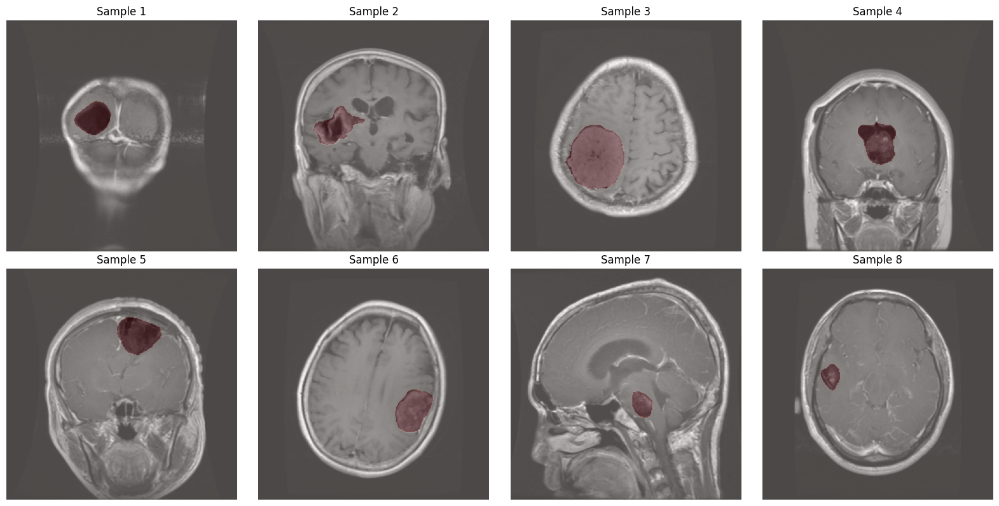

In [8]:
'''
Once you're done making the dataset, use the function below to vizualize it.
'''
def visualize_samples(images, masks):
    num_samples = len(images)
    fig, axes = plt.subplots(nrows=2, ncols=num_samples // 2, figsize=(16, 8))

    for i, (image, mask) in enumerate(zip(images, masks)):
        image = image.squeeze(0)
        mask = mask.squeeze(0)
        ax = axes[i // (num_samples // 2), i % (num_samples // 2)]
        ax.imshow(image, cmap='gray')
        ax.imshow(mask, alpha=0.3, cmap='Reds')
        ax.axis('off')
        ax.set_title(f'Sample {i+1}')
    plt.tight_layout()
    plt.show()


# Select 8 random samples from the training dataset
random_indices = np.random.choice(len(train_dataset), 8, replace=False)
random_samples = [(train_dataset[i][0], train_dataset[i][1]) for i in random_indices]

# Separate images and masks
random_images = [sample[0] for sample in random_samples]
random_masks = [sample[1] for sample in random_samples]

visualize_samples(random_images, random_masks)


### **Task 2: Implement the Dice Loss Function**  
In segmentation tasks, using MSE loss is often ineffective due to class imbalance, especially when the region of interest (e.g., brain tumors) is small. Hence, you are going to implement the Dice Loss by creating a custom `DiceLoss` class. Dice Loss is more suitable for segmentation tasks as it directly measures overlap between predictions and ground truth.  

Given:  
- **Predicted mask:** \( p \)  
- **Ground truth:** \( t \)  
- **Smoothing factor:** \( s \) (prevents division by zero)  

#### $L = 1 - \frac{2 \cdot \sum(p \cdot t) + s}{\sum(p^{2}) + \sum(t^{2}) + s}$

The smoothing factor $s$ is a small value (usually of the order of $1e^{-6}$).
For more details, see [this paper](https://arxiv.org/pdf/1606.04797.pdf) (page 6).  


In [30]:
class DiceLoss(nn.Module):
    def __init__(self):
        super(DiceLoss, self).__init__()
        

    def forward(self, prediction, target):
        # Code here
        smoothing_value = 1e-6
        pred_flattened = prediction.view(-1)
        target_flattened = target.view(-1)
        intersection = (pred_flattened * target_flattened).sum() + smoothing_value
        denominator = (pred_flattened * pred_flattened).sum() + (target_flattened * target_flattened).sum() + smoothing_value
        dice_coeff = (2 * intersection) / denominator

        return (1 - dice_coeff)

### **Task 3: Define Autoencoder for Brain Tumor segmentation**


In [55]:
class SegmentationAE(nn.Module):
    def __init__(self):
        super(SegmentationAE, self).__init__()
        
        # --- Encoder ---
        # Code here
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels = 1, out_channels = 16, kernel_size = 3, stride = 2, padding = 1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.Dropout(0.35),

            nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = 3, stride = 2, padding = 1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Dropout(0.35),

            nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, stride = 2, padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.35),

            nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, stride = 2, padding = 1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Dropout(0.35),

            nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 3, stride = 2, padding = 1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Dropout(0.35),
        )
        # --- Decoder ---
        # Code here
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(in_channels = 256, out_channels = 128, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Dropout(0.35),
            
            nn.ConvTranspose2d(in_channels = 128, out_channels = 64, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.35),

            nn.ConvTranspose2d(in_channels = 64, out_channels = 32, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Dropout(0.35),

            nn.ConvTranspose2d(in_channels = 32, out_channels = 16, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.Dropout(0.35),

            nn.ConvTranspose2d(in_channels = 16, out_channels = 1, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        # code here
        x = self.encoder(x)
        x = self.decoder(x)
        return x


# Instantiate randomly and print summary (size of your model, no. params and stuff)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SegmentationAE().to(device)
summary(model, input_size=(1, 256, 256), batch_size=BATCH_SIZE)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [64, 16, 128, 128]             160
       BatchNorm2d-2         [64, 16, 128, 128]              32
              ReLU-3         [64, 16, 128, 128]               0
           Dropout-4         [64, 16, 128, 128]               0
            Conv2d-5           [64, 32, 64, 64]           4,640
       BatchNorm2d-6           [64, 32, 64, 64]              64
              ReLU-7           [64, 32, 64, 64]               0
           Dropout-8           [64, 32, 64, 64]               0
            Conv2d-9           [64, 64, 32, 32]          18,496
      BatchNorm2d-10           [64, 64, 32, 32]             128
             ReLU-11           [64, 64, 32, 32]               0
          Dropout-12           [64, 64, 32, 32]               0
           Conv2d-13          [64, 128, 16, 16]          73,856
      BatchNorm2d-14          [64, 128,

### **Task 4: Define the Training Loop**  

- Print both the training and validation losses for each epoch.  
- Plot the training and validation loss curves, with epochs on the x-axis and losses on the y-axis, at the end of the training.  
- Save the best model as a `.pth` file using the `torch.save()` method. **Submit this file along with your notebook, naming it as `campus_id.pth`.**  
- After every 2ish epochs, visualize a grid displaying the Image | Ground Truth Mask | Predicted Mask.


Epoch 1/30 - Train Loss: 0.9208 - Val Loss: 0.9584
Epoch 2/30 - Train Loss: 0.8788 - Val Loss: 0.8495


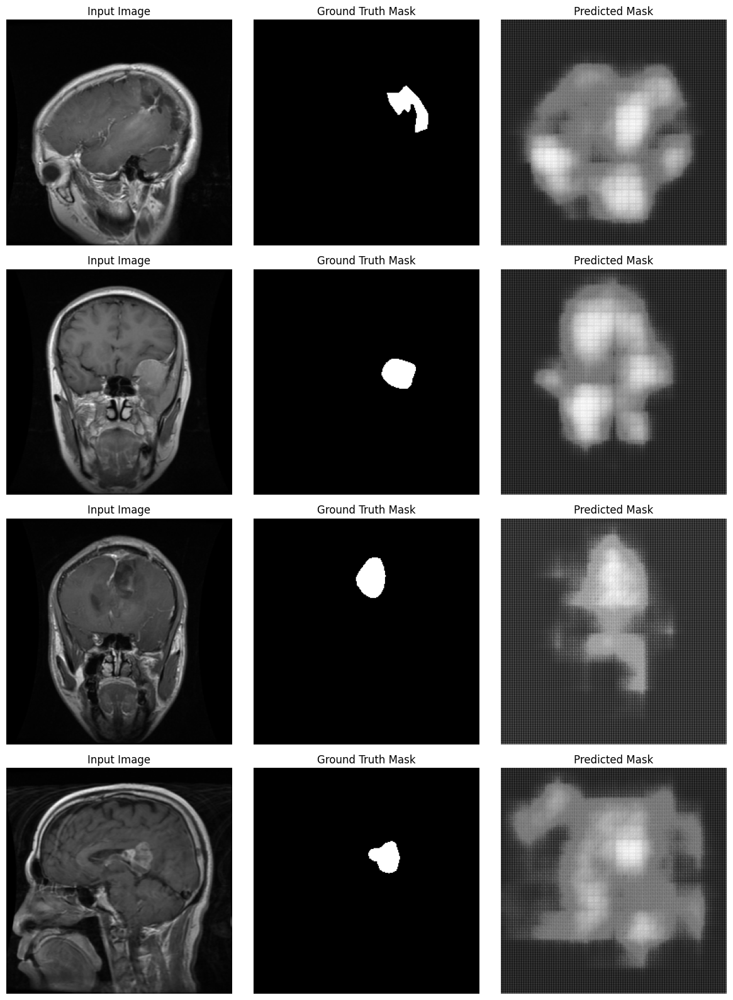

Epoch 3/30 - Train Loss: 0.8117 - Val Loss: 0.7356
Epoch 4/30 - Train Loss: 0.7024 - Val Loss: 0.7637


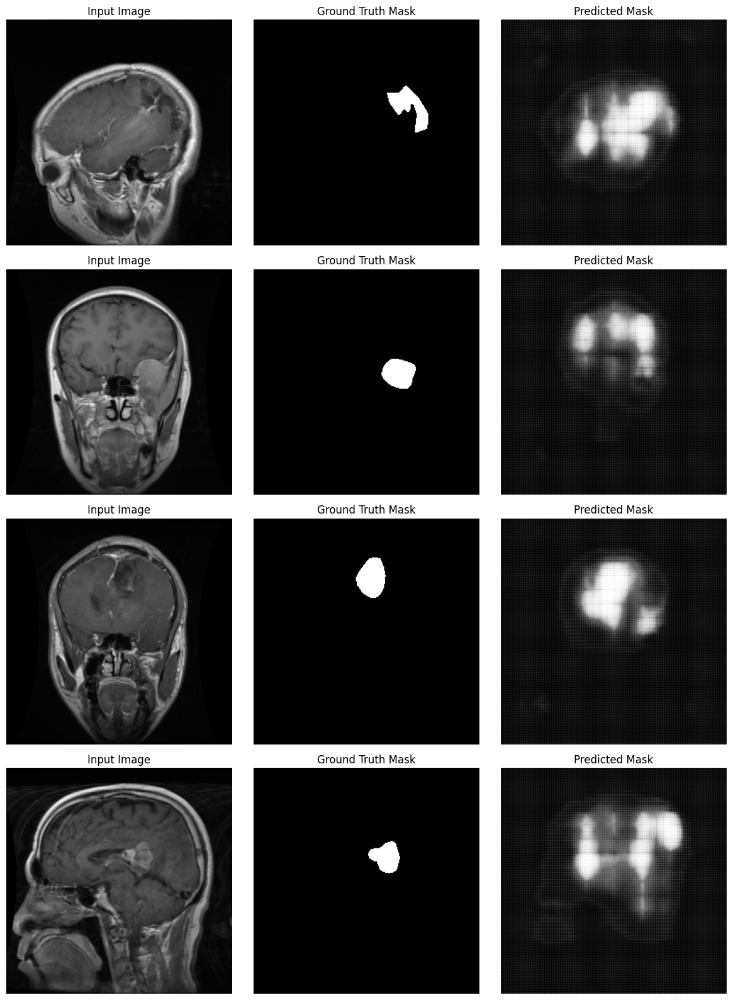

Epoch 5/30 - Train Loss: 0.5952 - Val Loss: 0.5034
Epoch 6/30 - Train Loss: 0.5195 - Val Loss: 0.4458


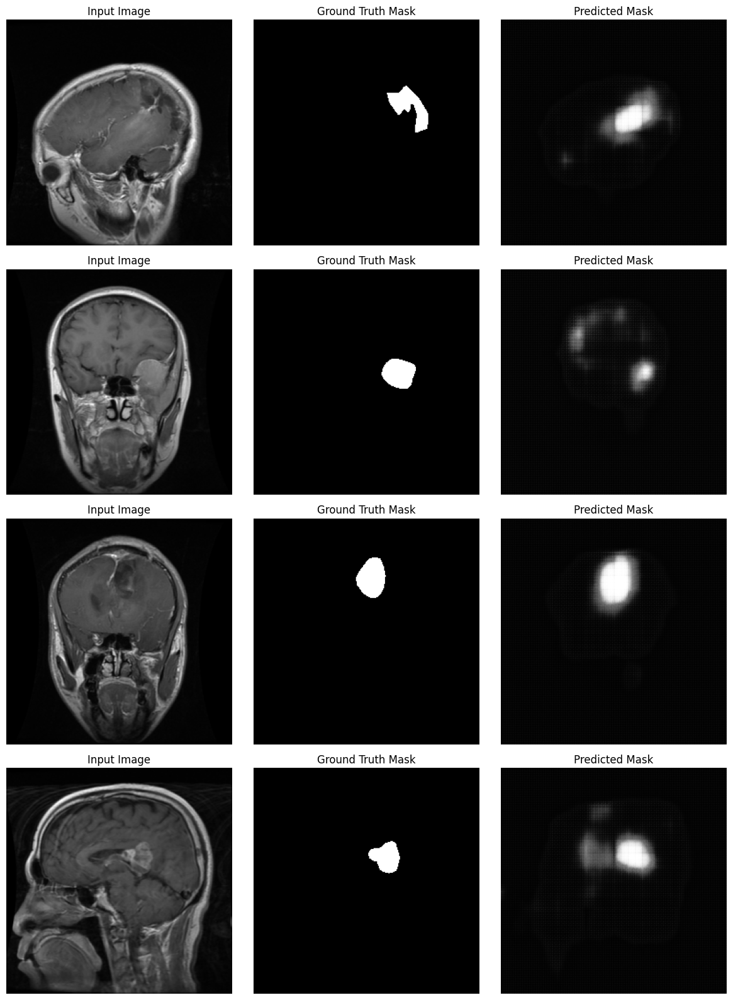

Epoch 7/30 - Train Loss: 0.4768 - Val Loss: 0.4302
Epoch 8/30 - Train Loss: 0.4431 - Val Loss: 0.3995


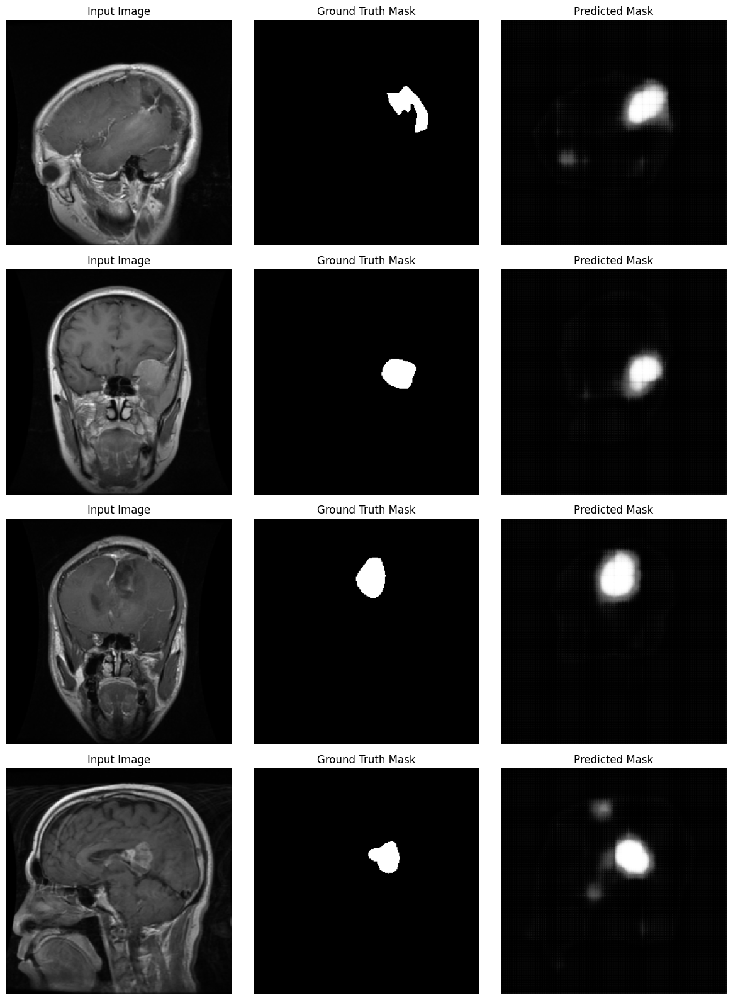

Epoch 9/30 - Train Loss: 0.4187 - Val Loss: 0.4352
Epoch 10/30 - Train Loss: 0.4038 - Val Loss: 0.3630


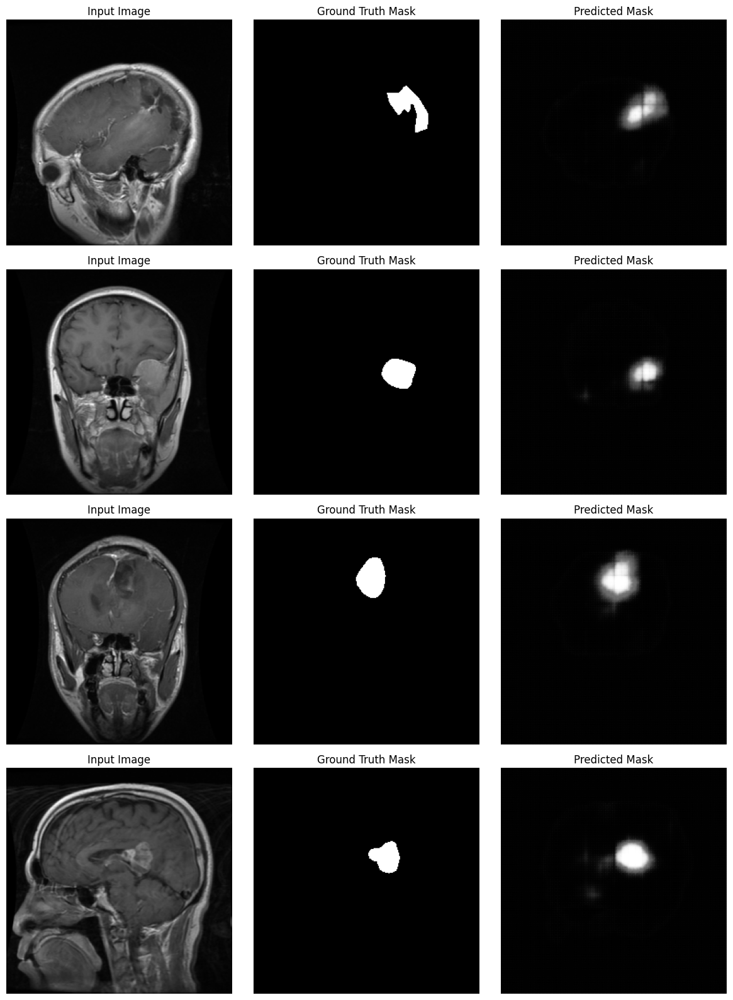

Epoch 11/30 - Train Loss: 0.3820 - Val Loss: 0.3451
Epoch 12/30 - Train Loss: 0.3674 - Val Loss: 0.3576


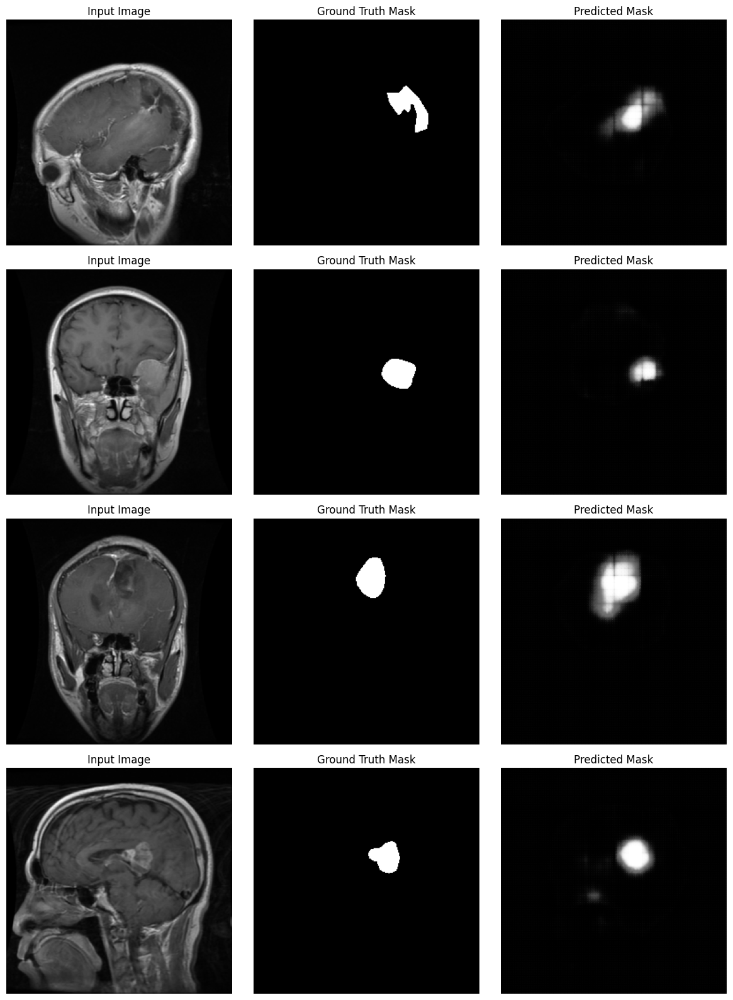

Epoch 13/30 - Train Loss: 0.3611 - Val Loss: 0.3310
Epoch 14/30 - Train Loss: 0.3455 - Val Loss: 0.3189


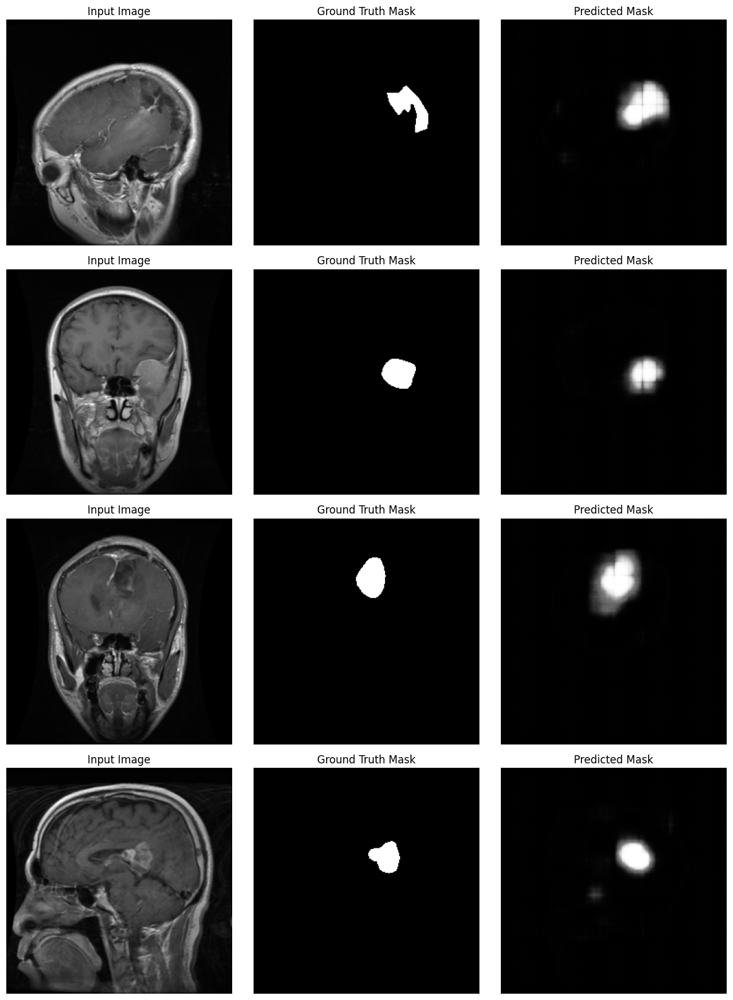

Epoch 15/30 - Train Loss: 0.3332 - Val Loss: 0.3379
Epoch 16/30 - Train Loss: 0.3344 - Val Loss: 0.3175


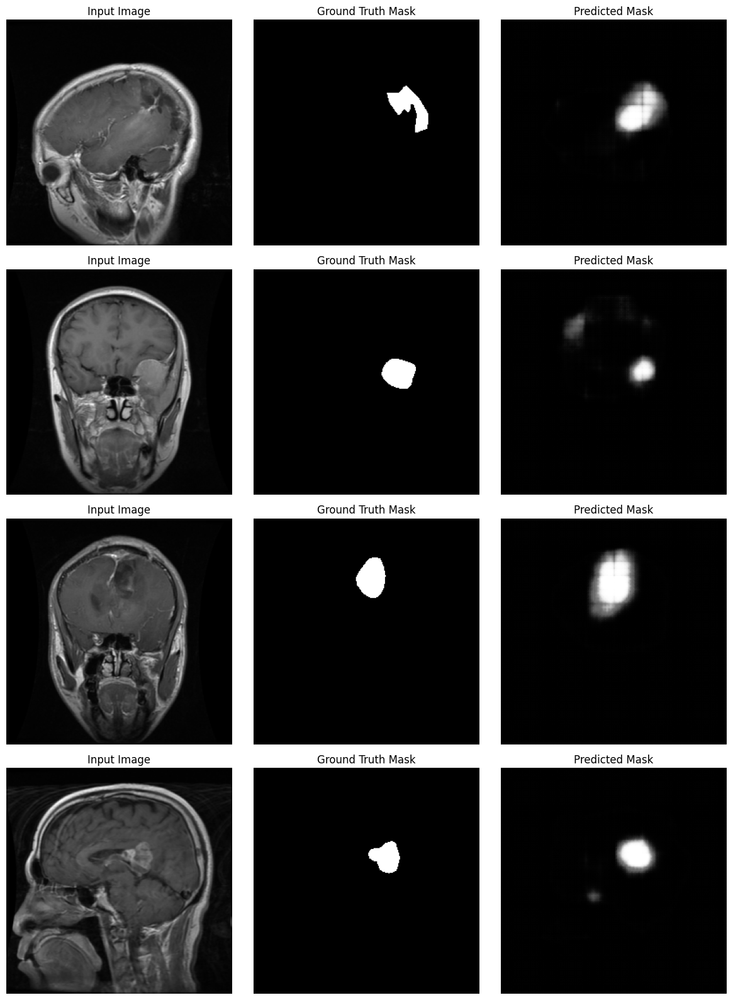

Epoch 17/30 - Train Loss: 0.3213 - Val Loss: 0.3336
Epoch 18/30 - Train Loss: 0.3135 - Val Loss: 0.3121


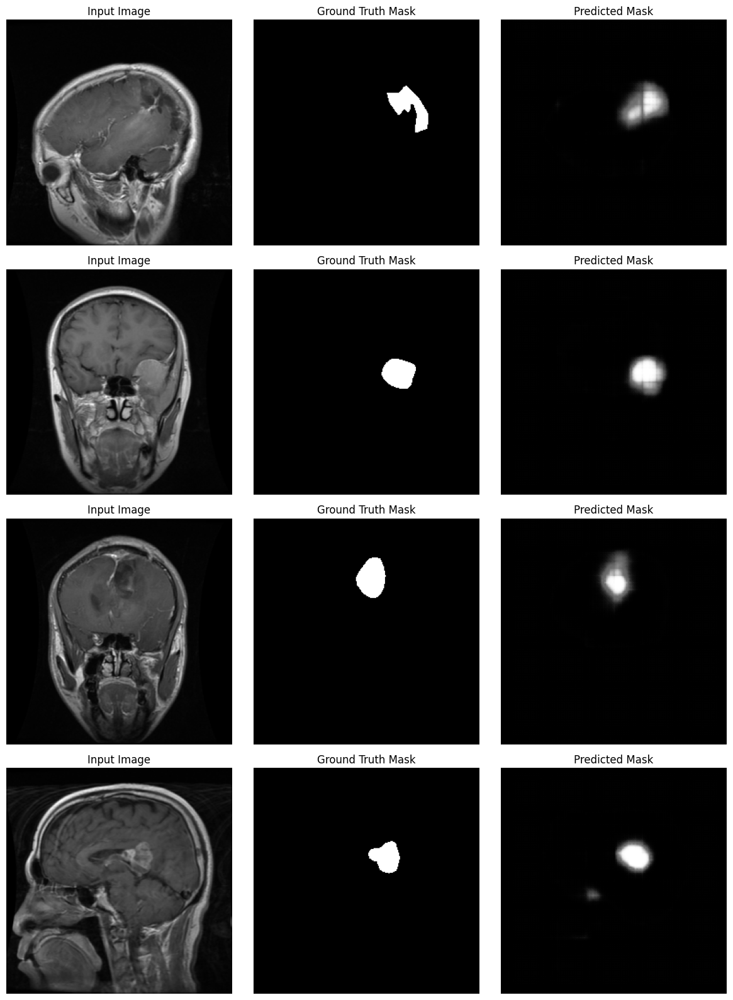

Epoch 19/30 - Train Loss: 0.3033 - Val Loss: 0.2947
Epoch 20/30 - Train Loss: 0.2976 - Val Loss: 0.2865


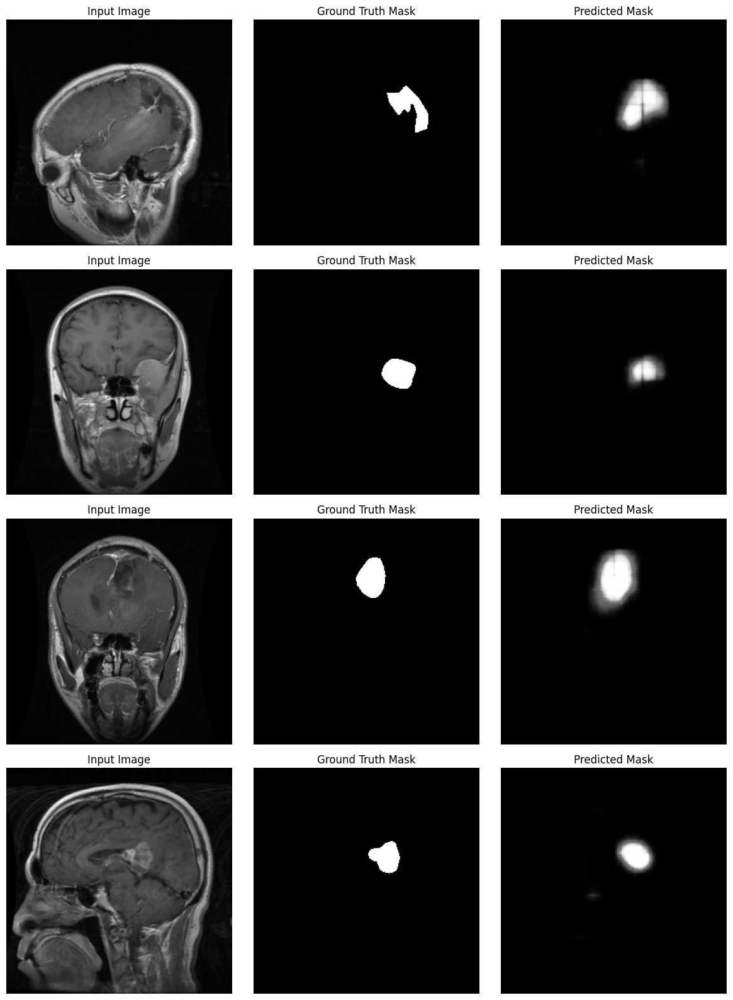

Epoch 21/30 - Train Loss: 0.2906 - Val Loss: 0.2840
Epoch 22/30 - Train Loss: 0.2837 - Val Loss: 0.2916


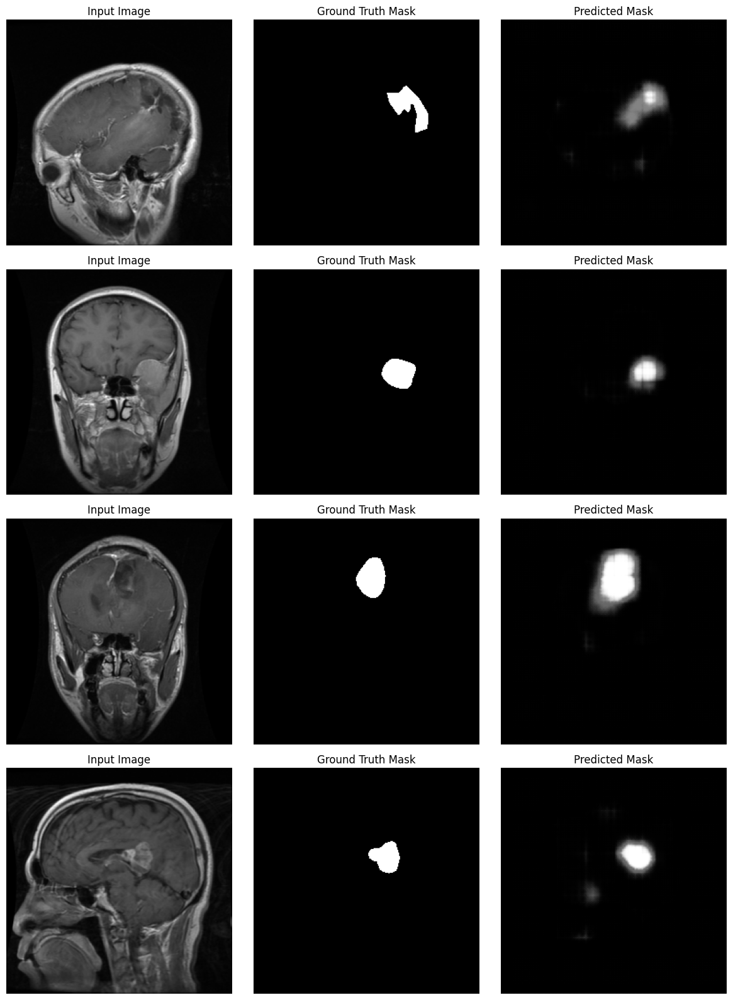

Epoch 23/30 - Train Loss: 0.2821 - Val Loss: 0.2752
Epoch 24/30 - Train Loss: 0.2798 - Val Loss: 0.2898


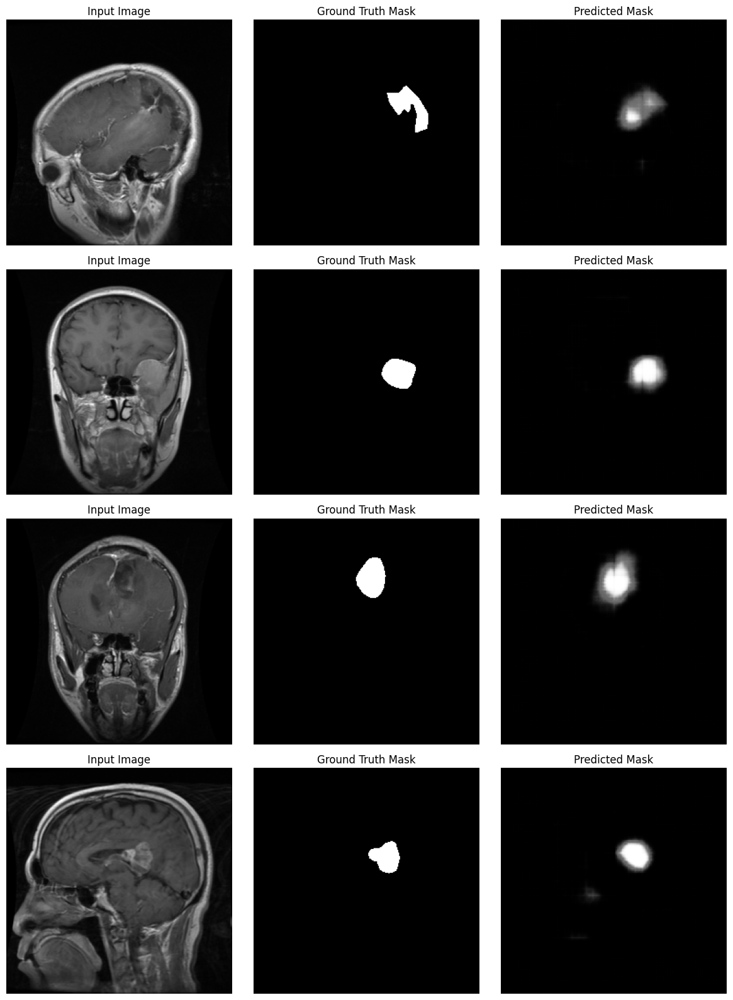

Epoch 25/30 - Train Loss: 0.2661 - Val Loss: 0.2762
Epoch 26/30 - Train Loss: 0.2676 - Val Loss: 0.2771


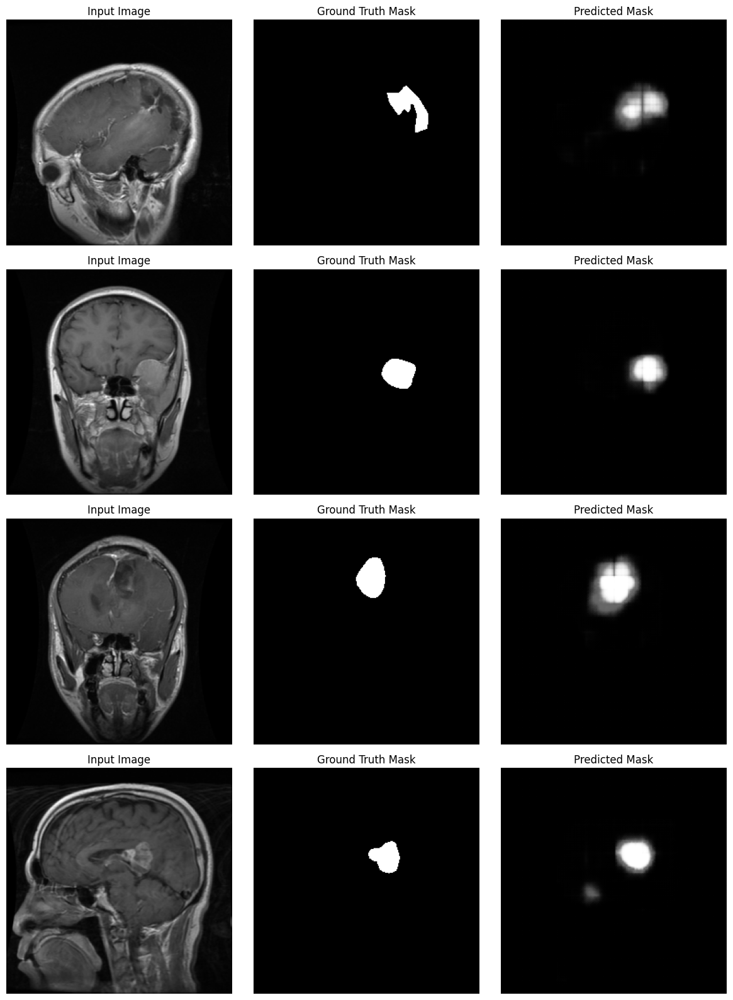

Epoch 27/30 - Train Loss: 0.2578 - Val Loss: 0.2670
Epoch 28/30 - Train Loss: 0.2544 - Val Loss: 0.2665


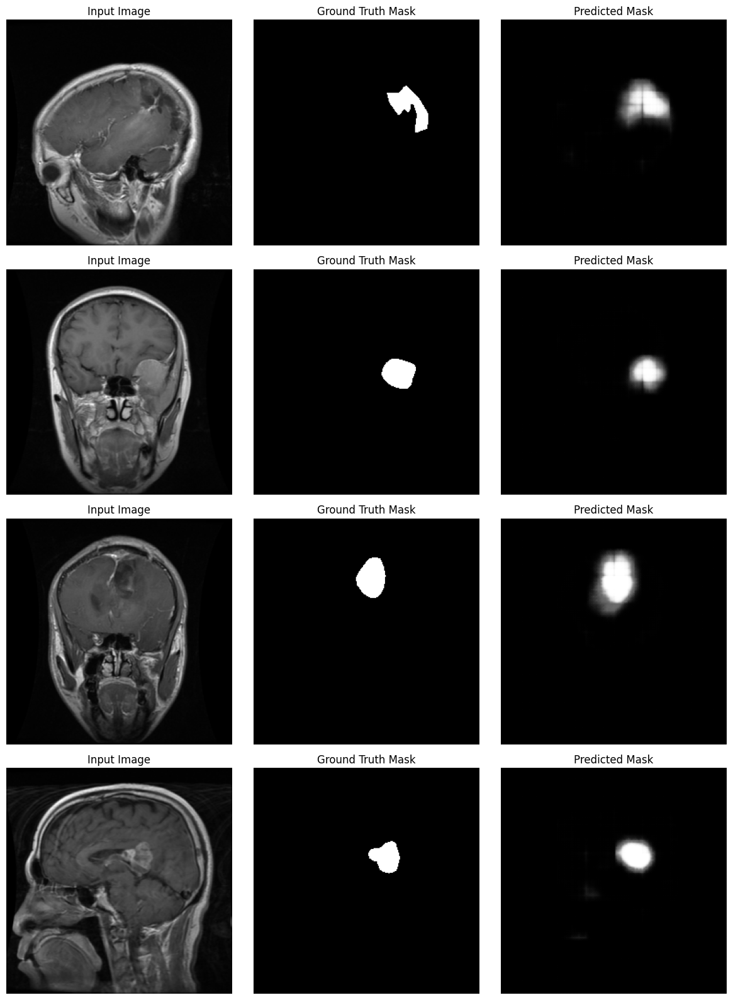

Epoch 29/30 - Train Loss: 0.2476 - Val Loss: 0.2708
Epoch 30/30 - Train Loss: 0.2439 - Val Loss: 0.2686


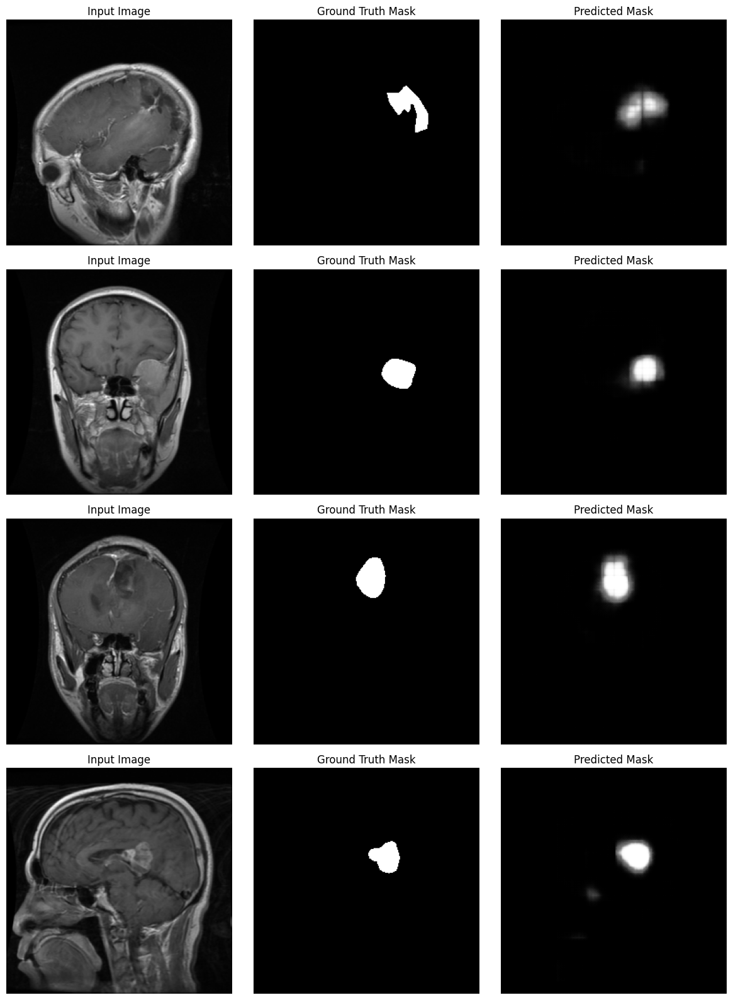

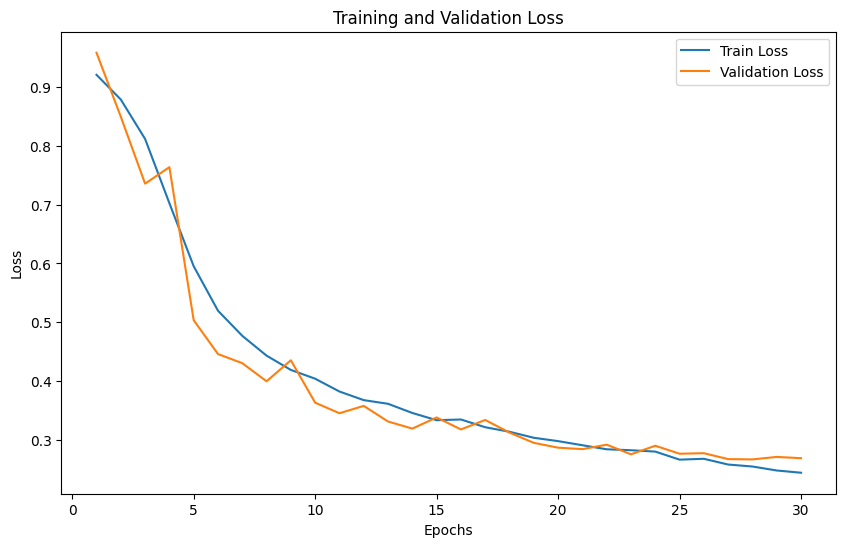

In [ ]:
# ----------------------------
# 1. Setup: define criterion, optimizer, and number of epochs
# ----------------------------
criterion = DiceLoss()
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0012, weight_decay = 1e-4)
num_epochs = 30
# ============ Your code here ============= #

def train_epoch(model, data_loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    
    for images, masks in data_loader:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
    
    epoch_loss = running_loss / len(data_loader.dataset)
    return epoch_loss

def validate_epoch(model, data_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for images, masks in data_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            loss = criterion(outputs, masks)
            running_loss += loss.item() * images.size(0)
    epoch_loss = running_loss / len(data_loader.dataset)
    return epoch_loss

def visualize_predictions(model, data_loader, device, num_samples=4):
    model.eval()
    images, masks = next(iter(data_loader))
    images, masks = images.to(device), masks.to(device)
    
    with torch.no_grad():
        outputs = model(images)
        
    images, masks, outputs = images.cpu(), masks.cpu(), outputs.cpu()
    num_samples = min(num_samples, images.size(0))
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4*num_samples))
    
    for i in range(num_samples):
        img_np = images[i, 0].numpy()
        gt_np  = masks[i, 0].numpy()
        pred_np = outputs[i, 0].numpy()
        
        axes[i, 0].imshow(img_np, cmap='gray')
        axes[i, 0].set_title("Input Image")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(gt_np, cmap='gray')
        axes[i, 1].set_title("Ground Truth Mask")
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(pred_np, cmap='gray')
        axes[i, 2].set_title("Predicted Mask")
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, device):
    train_losses = []
    val_losses = []
    
    for epoch in range(num_epochs):
        train_loss = train_epoch(model, train_loader, criterion, optimizer, device)
        val_loss = validate_epoch(model, val_loader, criterion, device)
        
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        
        print(f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f}")        
        if (epoch + 1) % 2 == 0:
            visualize_predictions(model, val_loader, device)
    
    return train_losses, val_losses

train_losses, val_losses = train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, device)

plt.figure(figsize=(10,6))
plt.plot(range(1, num_epochs+1), train_losses, label="Train Loss")
plt.plot(range(1, num_epochs+1), val_losses, label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.show()


### **Task 5: Evaluate Your Autoencoder's Segmentation**  

- Select and visualize **10 random samples** from the test set, displaying the **Image | Ground Truth Mask | Predicted Mask** in a grid format.  
- Compute the **Dice Coefficient** and **Intersection over Union (IoU)** scores for the entire test dataset.  

#### **Mathematical Expressions:**  
- **Dice Coefficient (DICE):**  $\text{DICE} = \frac{2 \times \sum(p \cup t)}{\sum(p) + \sum(t)}$

- **Intersection over Union (IoU):**  $\text{IoU} = \frac{\sum(p \cup t)}{\sum(p \cap t)}$

Where:  
- $p$ = Predicted mask (binary)  
- $t$ = Ground truth mask (binary)  

Make sure to print the computed scores.

In [57]:
def dice_coef(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask * groundtruth_mask)
    total_sum = np.sum(pred_mask) + np.sum(groundtruth_mask)
    dice = (2 * intersect) / total_sum if total_sum > 0 else 1.0
    return dice

def iou(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask * groundtruth_mask)
    union = np.sum(pred_mask) + np.sum(groundtruth_mask) - intersect
    iou_value = intersect / union if union > 0 else 1.0
    return iou_value

Average Dice Coefficient on Test Set: 0.6091
Average IoU on Test Set: 0.5110


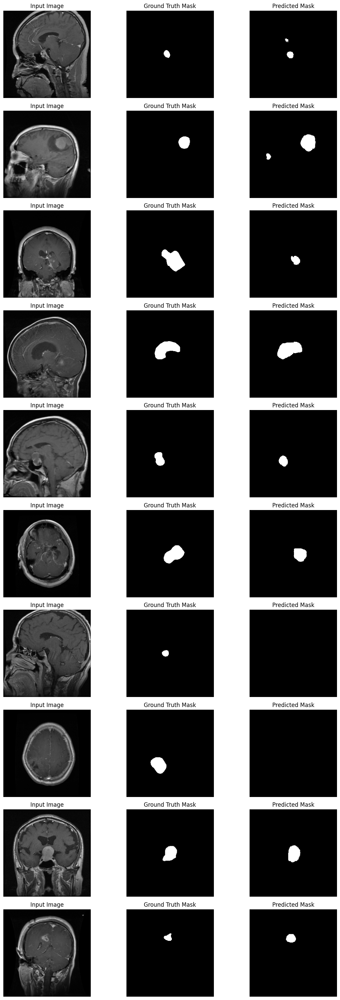

In [58]:
def evaluate_model(model, data_loader, device):
    model.eval()
    dice_scores = []
    iou_scores = []
    all_images = []
    all_masks = []
    all_preds = []
    
    with torch.no_grad():
        for images, masks in data_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            preds = (outputs > 0.5).float()
            
            for i in range(images.size(0)):
                gt = masks[i].cpu().numpy()  
                pred = preds[i].cpu().numpy() 
                
                dice_scores.append(dice_coef(gt, pred))
                iou_scores.append(iou(gt, pred))
                
                all_images.append(images[i].cpu().numpy().squeeze())
                all_masks.append(gt.squeeze())
                all_preds.append(pred.squeeze())
    
    avg_dice = np.mean(dice_scores)
    avg_iou = np.mean(iou_scores)
    return avg_dice, avg_iou, all_images, all_masks, all_preds

avg_dice, avg_iou, all_images, all_masks, all_preds = evaluate_model(model, test_loader, device)

print(f"Average Dice Coefficient on Test Set: {avg_dice:.4f}")
print(f"Average IoU on Test Set: {avg_iou:.4f}")

num_samples = 10
sample_indices = random.sample(range(len(all_images)), num_samples)

fig, axes = plt.subplots(num_samples, 3, figsize=(12, 3*num_samples))
for row, idx in enumerate(sample_indices):

    axes[row, 0].imshow(all_images[idx], cmap='gray')
    axes[row, 0].set_title("Input Image")
    axes[row, 0].axis("off")
    
    axes[row, 1].imshow(all_masks[idx], cmap='gray')
    axes[row, 1].set_title("Ground Truth Mask")
    axes[row, 1].axis("off")
    
    axes[row, 2].imshow(all_preds[idx], cmap='gray')
    axes[row, 2].set_title("Predicted Mask")
    axes[row, 2].axis("off")
    
plt.tight_layout()
plt.show()

In [59]:
torch.save(model, "26100228.pth")

## Submissions
- Notebook.
- Best model's `.pth` file. Rename it to `campus_id.pth`.